In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [2]:
# Commented out IPython magic to ensure Python compatibility.
# %matplotlib inline

# Commented out IPython magic to ensure Python compatibility.
from __future__ import print_function
# %matplotlib inline
import argparse
import os
import random
import torch
import torch.nn as nn
import torch.nn.parallel
import torch.backends.cudnn as cudnn
import torch.optim as optim
import torch.utils.data
import torchvision.datasets as dset
import torchvision.transforms as transforms
import torchvision.utils as vutils
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from IPython.display import HTML
import torchvision
from torch.utils.data import DataLoader


In [3]:
# Number of workers for dataloader
workers = 2

# Batch size during training
batch_size = 256

# Number of channels in the training images. For color images this is 3
nc = 1

# Size of z latent vector (i.e. size of generator input)
nz = 100

# Size of feature maps in generator
ngf = 64

# Size of feature maps in discriminator
ndf = 64

# Number of training epochs
num_epochs = 5

# Learning rate for optimizers
lr = 0.0002

# Beta1 hyperparam for Adam optimizers
beta1 = 0.5

# Number of GPUs available. Use 0 for CPU mode.
ngpu = 1

bias = True
device = torch.device("cuda:0" if (torch.cuda.is_available() and ngpu > 0) else "cpu")


cuda:0


100%|██████████| 9912422/9912422 [00:00<00:00, 80333794.96it/s]


Extracting /files/MNIST/raw/train-images-idx3-ubyte.gz to /files/MNIST/raw



100%|██████████| 28881/28881 [00:00<00:00, 104607680.33it/s]


Extracting /files/MNIST/raw/train-labels-idx1-ubyte.gz to /files/MNIST/raw



100%|██████████| 1648877/1648877 [00:00<00:00, 20894878.61it/s]


Extracting /files/MNIST/raw/t10k-images-idx3-ubyte.gz to /files/MNIST/raw



100%|██████████| 4542/4542 [00:00<00:00, 4940489.83it/s]


Extracting /files/MNIST/raw/t10k-labels-idx1-ubyte.gz to /files/MNIST/raw

max:  tensor(1.)
min:  tensor(0.)
dhape = torch.Size([28, 28])
max:  tensor(1.)
min:  tensor(0.)
dhape = torch.Size([28, 28])
max:  tensor(1.)
min:  tensor(0.)
dhape = torch.Size([28, 28])
max:  tensor(1.)
min:  tensor(0.)
dhape = torch.Size([28, 28])
max:  tensor(1.)
min:  tensor(0.)
dhape = torch.Size([28, 28])
max:  tensor(1.)
min:  tensor(0.)
dhape = torch.Size([28, 28])


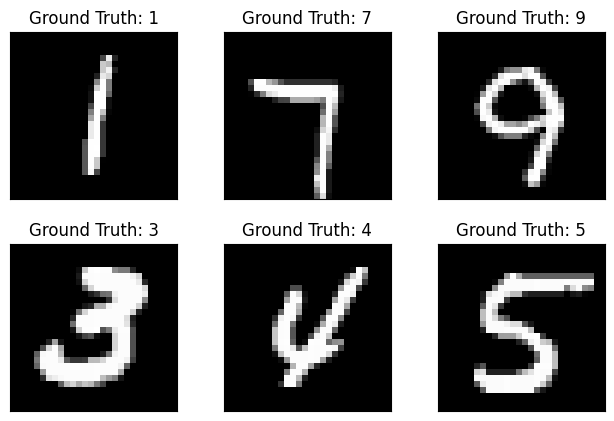

In [4]:
print(device)

dataset = torchvision.datasets.MNIST('/files/', download=True,
                             transform=torchvision.transforms.Compose([
                               torchvision.transforms.ToTensor()]))

data_loader = torch.utils.data.DataLoader(dataset, batch_size=batch_size, shuffle=True)

examples = enumerate(data_loader)
batch_idx, (example_data, example_targets) = next(examples)
fig = plt.figure()
for i in range(6):
  print("max: " ,torch.max(example_data[i][0]))
  print("min: " ,torch.min(example_data[i][0]))
  plt.subplot(2,3,i+1)
  plt.tight_layout()
  print(f"dhape = {example_data[i][0].shape}")
  plt.imshow(example_data[i][0], cmap='gray', interpolation='none')
  plt.title("Ground Truth: {}".format(example_targets[i]))
  plt.xticks([])
  plt.yticks([])




In [5]:
class Generator(nn.Module):
    def __init__(self, nz=nz):
        super(Generator, self).__init__()
        self.gen_CNN = nn.Sequential(
            # input is Z, going into a convolution
            nn.ConvTranspose2d(nz,ngf * 8, 4, 1, 0, bias=bias),
            nn.BatchNorm2d(ngf * 8),
            nn.ReLU(True),
            # state size. (ngf*8) x 4 x 4
            nn.ConvTranspose2d(ngf * 8,ngf * 4, 4, 2, 1, bias=bias),
            nn.BatchNorm2d(ngf * 4),
            nn.ReLU(True),
            # state size. (ngf*4) x 8 x 8
            nn.ConvTranspose2d(ngf * 4,ngf * 2, 4, 2, 1, bias=bias),
            nn.BatchNorm2d(ngf * 2),
            nn.ReLU(True),
            # state size. (ngf*2) x 16 x 16
            nn.ConvTranspose2d(ngf * 2,ngf, 4, 2, 1, bias=bias),
            nn.BatchNorm2d(ngf),
            nn.ReLU(True),
            nn.ConvTranspose2d(ngf,nc,kernel_size=1, stride=1, padding=2, bias=bias),
            nn.Tanh()
        )

    def forward(self, x):
        x = self.gen_CNN(x)
        return x

class Discriminator(nn.Module):
    def __init__(self):
        super(Discriminator, self).__init__()
        self.disc = nn.Sequential(
            # input is (nc) x 28 x 28
            nn.Conv2d(nc, ndf, 4, 2, 1, bias=bias),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. (ndf) x 32 x 32
            nn.Conv2d(ndf, ndf * 2, 4, 2, 1, bias=bias),
            nn.BatchNorm2d(ndf * 2),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. (ndf*2) x 16 x 16
            nn.Conv2d(ndf * 2, ndf * 4, 4, 2, 1, bias=bias),
            nn.BatchNorm2d(ndf * 4),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. (ndf*4) x 8 x 8
            nn.Conv2d(ndf * 4, 1, 4, 2, 1, bias=bias),
            nn.Sigmoid()
        )

    def forward(self, x):
        x = self.disc(x)
        x = x.view(-1, 1).squeeze(1)
        return x


In [6]:
# custom weights initialization called on netG and netD
def weights_init(m):
    classname = m.__class__.__name__
    if classname.find('Conv') != -1:
        nn.init.normal_(m.weight.data, 0.0, 0.02)
    elif classname.find('BatchNorm') != -1:
        nn.init.normal_(m.weight.data, 1.0, 0.02)
        nn.init.constant_(m.bias.data, 0)

In [27]:
# Create the generator
netG = Generator().to(device)
netG.apply(weights_init)

netD = Discriminator().to(device)

# Handle multi-gpu if desired
if (device.type == 'cuda') and (ngpu > 1):
    netG = nn.DataParallel(netG, list(range(ngpu)))
if (device.type == 'cuda') and (ngpu > 1):
    netG = nn.DataParallel(netG, list(range(ngpu)))


In [29]:
BCE_ORIGINAL_GAN_LOSS = "BCE_ORIGINAL_GAN_LOSS"
NON_SATURATING_VERSION = "NON_SATURATING_VERSION"
MSE_LOSS = "MSE_LOSS"


CRITERION_TYPE = MSE_LOSS
if CRITERION_TYPE == BCE_ORIGINAL_GAN_LOSS:
  criterion = nn.BCELoss()
  SATURATION = True

elif CRITERION_TYPE == NON_SATURATING_VERSION:
  criterion = nn.BCELoss()
  SATURATION = False


elif CRITERION_TYPE == MSE_LOSS:
  criterion = nn.MSELoss()
  SATURATION = False

# Create batch of latent vectors that we will use to visualize
#  the progression of the generator
num_samples_to_check = 64

fixed_noise = torch.randn(num_samples_to_check, nz, 1, 1, device=device)

# Establish convention for real and fake labels during training
real_label = 1.
fake_label = 0.

# Setup Adam optimizers for both G and D
optimizerD = optim.Adam(netD.parameters(), lr=lr*0.9, betas=(beta1, 0.999))
optimizerG = optim.Adam(netG.parameters(), lr=lr, betas=(beta1, 0.999))

Question 1
-------

Loss Saturation. Train the generator together with the discriminator following the classic GAN paradigm taught in class. For this purpose explore the case where multiple training optimization steps are applied to the discriminator per a single iteration for the generator. Try three different GAN losses: (i) the original GAN cross entropy, (ii) the non-saturating version of this loss (as mentioned in class), and (iii) a least-squares loss (L2). See which losses lead to a saturation and explain why this is the case.

Train loop

Starting Training Loop...
[0/40][0/235]	Loss_D: 0.5075	Loss_G: 0.5797	D(x): 0.5432	D(G(z)): 0.5411 / 0.2397
[0/40][50/235]	Loss_D: 0.0318	Loss_G: 0.9627	D(x): 0.8432	D(G(z)): 0.0023 / 0.0189
[0/40][100/235]	Loss_D: 0.0193	Loss_G: 0.9859	D(x): 0.9730	D(G(z)): 0.1014 / 0.0071
[0/40][150/235]	Loss_D: 0.0003	Loss_G: 0.9857	D(x): 0.9931	D(G(z)): 0.0075 / 0.0072
[0/40][200/235]	Loss_D: 0.0015	Loss_G: 0.9966	D(x): 0.9797	D(G(z)): 0.0024 / 0.0017
[1/40][0/235]	Loss_D: 0.0858	Loss_G: 0.9668	D(x): 0.9713	D(G(z)): 0.2187 / 0.0171
[1/40][50/235]	Loss_D: 0.1134	Loss_G: 0.9302	D(x): 0.7137	D(G(z)): 0.0198 / 0.0360
[1/40][100/235]	Loss_D: 0.3995	Loss_G: 0.7868	D(x): 0.9474	D(G(z)): 0.5810 / 0.1174
[1/40][150/235]	Loss_D: 0.0678	Loss_G: 0.7311	D(x): 0.7902	D(G(z)): 0.0650 / 0.1495
[1/40][200/235]	Loss_D: 0.2323	Loss_G: 0.5787	D(x): 0.5554	D(G(z)): 0.0558 / 0.2485
[2/40][0/235]	Loss_D: 0.1499	Loss_G: 0.8111	D(x): 0.8876	D(G(z)): 0.3372 / 0.1011


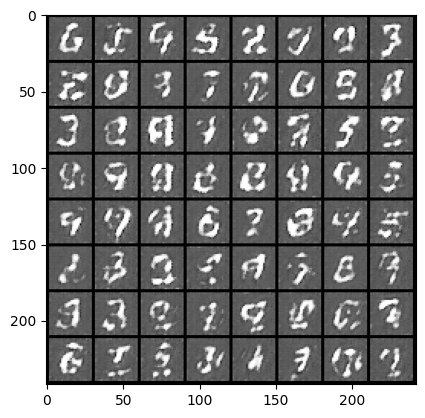

[2/40][50/235]	Loss_D: 0.1308	Loss_G: 0.6095	D(x): 0.7053	D(G(z)): 0.1117 / 0.2271
[2/40][100/235]	Loss_D: 0.1525	Loss_G: 0.6353	D(x): 0.8813	D(G(z)): 0.3343 / 0.2094
[2/40][150/235]	Loss_D: 0.0891	Loss_G: 0.7372	D(x): 0.8813	D(G(z)): 0.2340 / 0.1454
[2/40][200/235]	Loss_D: 0.0605	Loss_G: 0.8095	D(x): 0.8250	D(G(z)): 0.1253 / 0.1021
[3/40][0/235]	Loss_D: 0.2094	Loss_G: 0.3289	D(x): 0.5807	D(G(z)): 0.0406 / 0.4579
[3/40][50/235]	Loss_D: 0.0385	Loss_G: 0.9354	D(x): 0.8988	D(G(z)): 0.1246 / 0.0332
[3/40][100/235]	Loss_D: 0.0713	Loss_G: 0.8274	D(x): 0.8782	D(G(z)): 0.1926 / 0.0923
[3/40][150/235]	Loss_D: 0.1664	Loss_G: 0.9742	D(x): 0.9635	D(G(z)): 0.3767 / 0.0130
[3/40][200/235]	Loss_D: 0.1244	Loss_G: 0.9436	D(x): 0.9411	D(G(z)): 0.3068 / 0.0288
[4/40][0/235]	Loss_D: 0.1097	Loss_G: 0.6635	D(x): 0.7086	D(G(z)): 0.0537 / 0.1937
[4/40][50/235]	Loss_D: 0.0623	Loss_G: 0.8705	D(x): 0.8270	D(G(z)): 0.1288 / 0.0684


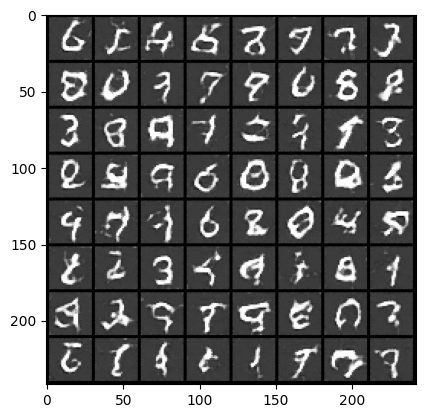

[4/40][100/235]	Loss_D: 0.1232	Loss_G: 0.8650	D(x): 0.7014	D(G(z)): 0.0912 / 0.0711
[4/40][150/235]	Loss_D: 0.2559	Loss_G: 0.8717	D(x): 0.9540	D(G(z)): 0.4684 / 0.0675
[4/40][200/235]	Loss_D: 0.0710	Loss_G: 0.9097	D(x): 0.8191	D(G(z)): 0.1320 / 0.0469
[5/40][0/235]	Loss_D: 0.0868	Loss_G: 0.8394	D(x): 0.8386	D(G(z)): 0.1914 / 0.0855
[5/40][50/235]	Loss_D: 0.3655	Loss_G: 0.8075	D(x): 0.4277	D(G(z)): 0.0344 / 0.1038
[5/40][100/235]	Loss_D: 0.1461	Loss_G: 0.6381	D(x): 0.9027	D(G(z)): 0.3282 / 0.2074
[5/40][150/235]	Loss_D: 0.1184	Loss_G: 0.8879	D(x): 0.9116	D(G(z)): 0.2873 / 0.0587
[5/40][200/235]	Loss_D: 0.1460	Loss_G: 0.8770	D(x): 0.8980	D(G(z)): 0.3173 / 0.0647
[6/40][0/235]	Loss_D: 0.1138	Loss_G: 0.7901	D(x): 0.8332	D(G(z)): 0.2350 / 0.1142
[6/40][50/235]	Loss_D: 0.1956	Loss_G: 0.7435	D(x): 0.5936	D(G(z)): 0.0526 / 0.1427


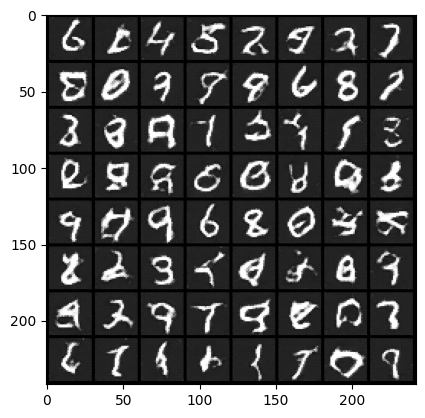

[6/40][100/235]	Loss_D: 0.1269	Loss_G: 0.8567	D(x): 0.7463	D(G(z)): 0.1733 / 0.0756
[6/40][150/235]	Loss_D: 0.2348	Loss_G: 0.8744	D(x): 0.9335	D(G(z)): 0.4383 / 0.0663
[6/40][200/235]	Loss_D: 0.1006	Loss_G: 0.8418	D(x): 0.7690	D(G(z)): 0.1377 / 0.0848
[7/40][0/235]	Loss_D: 0.0888	Loss_G: 0.7066	D(x): 0.8154	D(G(z)): 0.1758 / 0.1658
[7/40][50/235]	Loss_D: 0.1268	Loss_G: 0.8518	D(x): 0.7236	D(G(z)): 0.1392 / 0.0801
[7/40][100/235]	Loss_D: 0.1162	Loss_G: 0.8069	D(x): 0.7483	D(G(z)): 0.1588 / 0.1045
[7/40][150/235]	Loss_D: 0.0944	Loss_G: 0.7715	D(x): 0.7415	D(G(z)): 0.0728 / 0.1262
[7/40][200/235]	Loss_D: 0.2873	Loss_G: 0.7456	D(x): 0.5036	D(G(z)): 0.0620 / 0.1408
[8/40][0/235]	Loss_D: 0.2093	Loss_G: 0.8937	D(x): 0.8820	D(G(z)): 0.3992 / 0.0555
[8/40][50/235]	Loss_D: 0.0517	Loss_G: 0.8477	D(x): 0.8413	D(G(z)): 0.1038 / 0.0813
[8/40][100/235]	Loss_D: 0.0874	Loss_G: 0.7713	D(x): 0.8244	D(G(z)): 0.1857 / 0.1254


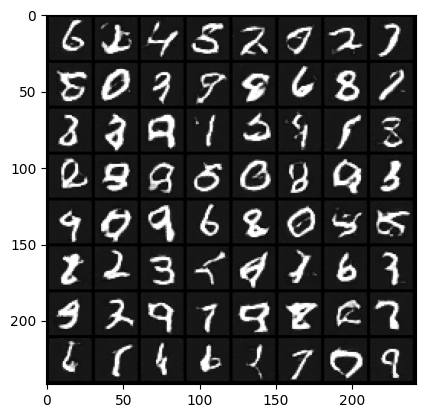

[8/40][150/235]	Loss_D: 0.0742	Loss_G: 0.8282	D(x): 0.8559	D(G(z)): 0.1738 / 0.0924
[8/40][200/235]	Loss_D: 0.0860	Loss_G: 0.6114	D(x): 0.8164	D(G(z)): 0.1700 / 0.2305
[9/40][0/235]	Loss_D: 0.2527	Loss_G: 0.8719	D(x): 0.9203	D(G(z)): 0.4474 / 0.0680
[9/40][50/235]	Loss_D: 0.1594	Loss_G: 0.7995	D(x): 0.6738	D(G(z)): 0.1197 / 0.1096
[9/40][100/235]	Loss_D: 0.1321	Loss_G: 0.6433	D(x): 0.7951	D(G(z)): 0.2471 / 0.2070
[9/40][150/235]	Loss_D: 0.3968	Loss_G: 0.8051	D(x): 0.9391	D(G(z)): 0.5829 / 0.1125
[9/40][200/235]	Loss_D: 0.1227	Loss_G: 0.7947	D(x): 0.8113	D(G(z)): 0.2368 / 0.1115
[10/40][0/235]	Loss_D: 0.0989	Loss_G: 0.6903	D(x): 0.7898	D(G(z)): 0.1618 / 0.1760
[10/40][50/235]	Loss_D: 0.1020	Loss_G: 0.8731	D(x): 0.8433	D(G(z)): 0.2188 / 0.0670
[10/40][100/235]	Loss_D: 0.0806	Loss_G: 0.8068	D(x): 0.8426	D(G(z)): 0.1751 / 0.1047


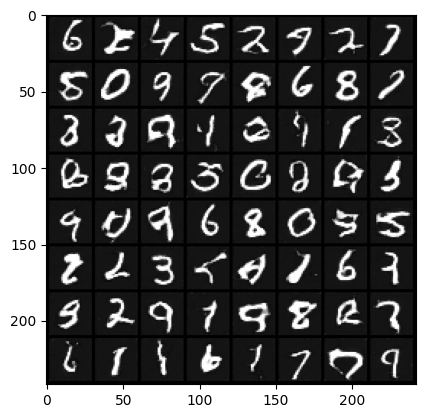

[10/40][150/235]	Loss_D: 0.0747	Loss_G: 0.7656	D(x): 0.8375	D(G(z)): 0.1609 / 0.1293
[10/40][200/235]	Loss_D: 0.1080	Loss_G: 0.8601	D(x): 0.8102	D(G(z)): 0.2091 / 0.0739
[11/40][0/235]	Loss_D: 0.1889	Loss_G: 0.9423	D(x): 0.8964	D(G(z)): 0.3702 / 0.0297
[11/40][50/235]	Loss_D: 0.1690	Loss_G: 0.6183	D(x): 0.6491	D(G(z)): 0.1142 / 0.2228
[11/40][100/235]	Loss_D: 0.1771	Loss_G: 0.8518	D(x): 0.6399	D(G(z)): 0.1151 / 0.0791
[11/40][150/235]	Loss_D: 0.1127	Loss_G: 0.7672	D(x): 0.8447	D(G(z)): 0.2375 / 0.1282
[11/40][200/235]	Loss_D: 0.1271	Loss_G: 0.7297	D(x): 0.7586	D(G(z)): 0.1700 / 0.1512
[12/40][0/235]	Loss_D: 0.1957	Loss_G: 0.8530	D(x): 0.8887	D(G(z)): 0.3752 / 0.0787
[12/40][50/235]	Loss_D: 0.1139	Loss_G: 0.5633	D(x): 0.7214	D(G(z)): 0.0981 / 0.2641
[12/40][100/235]	Loss_D: 0.2125	Loss_G: 0.8708	D(x): 0.6081	D(G(z)): 0.1048 / 0.0696
[12/40][150/235]	Loss_D: 0.0923	Loss_G: 0.7206	D(x): 0.8472	D(G(z)): 0.2032 / 0.1559


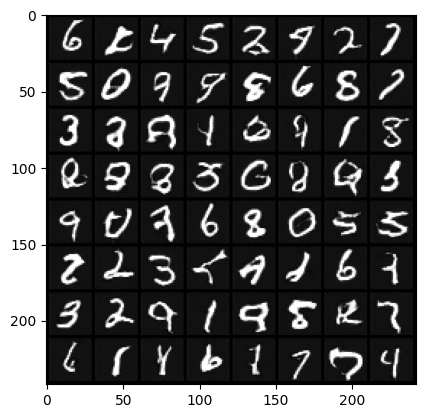

[12/40][200/235]	Loss_D: 0.0911	Loss_G: 0.8778	D(x): 0.7880	D(G(z)): 0.1339 / 0.0645
[13/40][0/235]	Loss_D: 0.0795	Loss_G: 0.8016	D(x): 0.8210	D(G(z)): 0.1472 / 0.1076
[13/40][50/235]	Loss_D: 0.1831	Loss_G: 0.6544	D(x): 0.6268	D(G(z)): 0.0902 / 0.2029
[13/40][100/235]	Loss_D: 0.1186	Loss_G: 0.5684	D(x): 0.8685	D(G(z)): 0.2538 / 0.2594
[13/40][150/235]	Loss_D: 0.1178	Loss_G: 0.5996	D(x): 0.7574	D(G(z)): 0.1522 / 0.2366
[13/40][200/235]	Loss_D: 0.1116	Loss_G: 0.8848	D(x): 0.8684	D(G(z)): 0.2519 / 0.0609
[14/40][0/235]	Loss_D: 0.0828	Loss_G: 0.7901	D(x): 0.7923	D(G(z)): 0.1085 / 0.1161
[14/40][50/235]	Loss_D: 0.1643	Loss_G: 0.6395	D(x): 0.6414	D(G(z)): 0.0707 / 0.2094
[14/40][100/235]	Loss_D: 0.1379	Loss_G: 0.8679	D(x): 0.6866	D(G(z)): 0.1080 / 0.0698
[14/40][150/235]	Loss_D: 0.1652	Loss_G: 0.4915	D(x): 0.6726	D(G(z)): 0.1190 / 0.3199
[14/40][200/235]	Loss_D: 0.1177	Loss_G: 0.8293	D(x): 0.8768	D(G(z)): 0.2639 / 0.0915


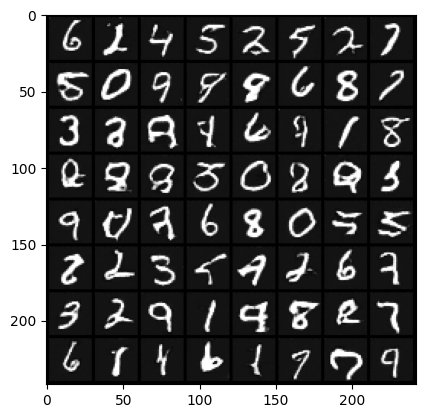

[15/40][0/235]	Loss_D: 0.0955	Loss_G: 0.7680	D(x): 0.7929	D(G(z)): 0.1611 / 0.1282
[15/40][50/235]	Loss_D: 0.1816	Loss_G: 0.8557	D(x): 0.9076	D(G(z)): 0.3655 / 0.0779
[15/40][100/235]	Loss_D: 0.1477	Loss_G: 0.8722	D(x): 0.6759	D(G(z)): 0.1153 / 0.0676
[15/40][150/235]	Loss_D: 0.0987	Loss_G: 0.6593	D(x): 0.8217	D(G(z)): 0.1947 / 0.1971
[15/40][200/235]	Loss_D: 0.3600	Loss_G: 0.7750	D(x): 0.4326	D(G(z)): 0.0376 / 0.1241
[16/40][0/235]	Loss_D: 0.4125	Loss_G: 0.4511	D(x): 0.4006	D(G(z)): 0.0547 / 0.3711
[16/40][50/235]	Loss_D: 0.1809	Loss_G: 0.7824	D(x): 0.6231	D(G(z)): 0.0767 / 0.1190
[16/40][100/235]	Loss_D: 0.1073	Loss_G: 0.7662	D(x): 0.8369	D(G(z)): 0.2209 / 0.1281
[16/40][150/235]	Loss_D: 0.0710	Loss_G: 0.8358	D(x): 0.9540	D(G(z)): 0.2206 / 0.0883
[16/40][200/235]	Loss_D: 0.1333	Loss_G: 0.7454	D(x): 0.7912	D(G(z)): 0.2347 / 0.1406
[17/40][0/235]	Loss_D: 0.1100	Loss_G: 0.6961	D(x): 0.7283	D(G(z)): 0.0944 / 0.1738


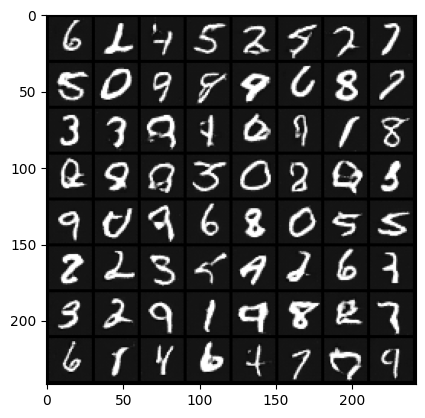

[17/40][50/235]	Loss_D: 0.1102	Loss_G: 0.8356	D(x): 0.8142	D(G(z)): 0.2205 / 0.0882
[17/40][100/235]	Loss_D: 0.2795	Loss_G: 0.5527	D(x): 0.9046	D(G(z)): 0.4696 / 0.2733
[17/40][150/235]	Loss_D: 0.1621	Loss_G: 0.6049	D(x): 0.6530	D(G(z)): 0.0850 / 0.2411
[17/40][200/235]	Loss_D: 0.1090	Loss_G: 0.5611	D(x): 0.8353	D(G(z)): 0.2231 / 0.2662
[18/40][0/235]	Loss_D: 0.1565	Loss_G: 0.6543	D(x): 0.7148	D(G(z)): 0.1684 / 0.2029
[18/40][50/235]	Loss_D: 0.0937	Loss_G: 0.8652	D(x): 0.7721	D(G(z)): 0.1112 / 0.0711
[18/40][100/235]	Loss_D: 0.1141	Loss_G: 0.7892	D(x): 0.7633	D(G(z)): 0.1669 / 0.1145
[18/40][150/235]	Loss_D: 0.3028	Loss_G: 0.8732	D(x): 0.9527	D(G(z)): 0.5091 / 0.0674
[18/40][200/235]	Loss_D: 0.1253	Loss_G: 0.7705	D(x): 0.6962	D(G(z)): 0.0688 / 0.1269
[19/40][0/235]	Loss_D: 0.1991	Loss_G: 0.8865	D(x): 0.9103	D(G(z)): 0.3839 / 0.0598


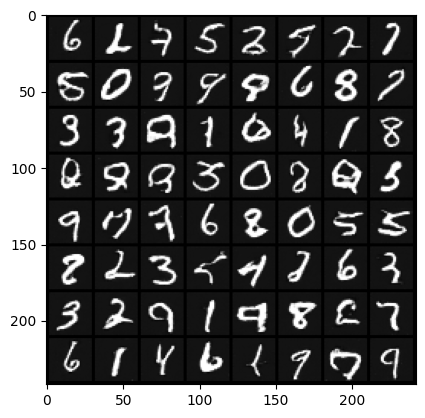

[19/40][50/235]	Loss_D: 0.1150	Loss_G: 0.8642	D(x): 0.8531	D(G(z)): 0.2468 / 0.0717
[19/40][100/235]	Loss_D: 0.0940	Loss_G: 0.7491	D(x): 0.8421	D(G(z)): 0.1958 / 0.1411
[19/40][150/235]	Loss_D: 0.1273	Loss_G: 0.5957	D(x): 0.7454	D(G(z)): 0.1670 / 0.2404
[19/40][200/235]	Loss_D: 0.1256	Loss_G: 0.8536	D(x): 0.7291	D(G(z)): 0.1335 / 0.0782
[20/40][0/235]	Loss_D: 0.1923	Loss_G: 0.5082	D(x): 0.6703	D(G(z)): 0.1830 / 0.3060
[20/40][50/235]	Loss_D: 0.1299	Loss_G: 0.7257	D(x): 0.7543	D(G(z)): 0.1844 / 0.1544
[20/40][100/235]	Loss_D: 0.1790	Loss_G: 0.8836	D(x): 0.6486	D(G(z)): 0.1266 / 0.0611
[20/40][150/235]	Loss_D: 0.1118	Loss_G: 0.5658	D(x): 0.7559	D(G(z)): 0.1459 / 0.2627
[20/40][200/235]	Loss_D: 0.1318	Loss_G: 0.6679	D(x): 0.7141	D(G(z)): 0.1212 / 0.1911
[21/40][0/235]	Loss_D: 0.1613	Loss_G: 0.7739	D(x): 0.8936	D(G(z)): 0.3213 / 0.1265
[21/40][50/235]	Loss_D: 0.1337	Loss_G: 0.8805	D(x): 0.8326	D(G(z)): 0.2546 / 0.0630


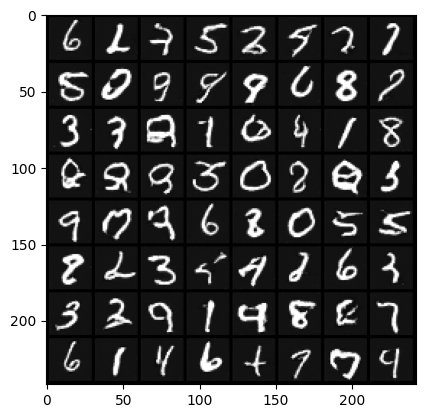

[21/40][100/235]	Loss_D: 0.1419	Loss_G: 0.8845	D(x): 0.6948	D(G(z)): 0.1189 / 0.0610
[21/40][150/235]	Loss_D: 0.0747	Loss_G: 0.7413	D(x): 0.8470	D(G(z)): 0.1685 / 0.1446
[21/40][200/235]	Loss_D: 0.1087	Loss_G: 0.8867	D(x): 0.8932	D(G(z)): 0.2489 / 0.0602
[22/40][0/235]	Loss_D: 0.2024	Loss_G: 0.3768	D(x): 0.5991	D(G(z)): 0.0525 / 0.4251
[22/40][50/235]	Loss_D: 0.1213	Loss_G: 0.6997	D(x): 0.7095	D(G(z)): 0.1120 / 0.1702
[22/40][100/235]	Loss_D: 0.2193	Loss_G: 0.8642	D(x): 0.6035	D(G(z)): 0.1531 / 0.0727
[22/40][150/235]	Loss_D: 0.1209	Loss_G: 0.8525	D(x): 0.9005	D(G(z)): 0.2836 / 0.0785
[22/40][200/235]	Loss_D: 0.1119	Loss_G: 0.8167	D(x): 0.7598	D(G(z)): 0.1594 / 0.0994
[23/40][0/235]	Loss_D: 0.1249	Loss_G: 0.8582	D(x): 0.8454	D(G(z)): 0.2547 / 0.0755
[23/40][50/235]	Loss_D: 0.2090	Loss_G: 0.7832	D(x): 0.5951	D(G(z)): 0.0919 / 0.1190


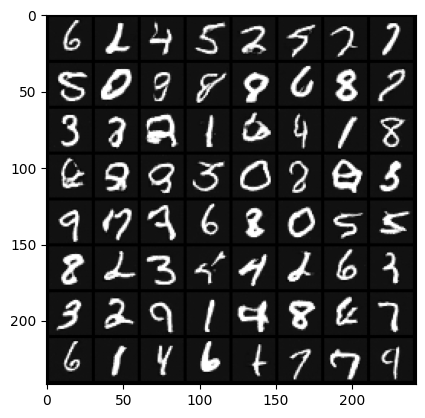

[23/40][100/235]	Loss_D: 0.1196	Loss_G: 0.6912	D(x): 0.7970	D(G(z)): 0.2009 / 0.1758
[23/40][150/235]	Loss_D: 0.1012	Loss_G: 0.9106	D(x): 0.9010	D(G(z)): 0.2484 / 0.0465
[23/40][200/235]	Loss_D: 0.1115	Loss_G: 0.8513	D(x): 0.8823	D(G(z)): 0.2558 / 0.0806
[24/40][0/235]	Loss_D: 0.2357	Loss_G: 0.6298	D(x): 0.6047	D(G(z)): 0.1317 / 0.2229
[24/40][50/235]	Loss_D: 0.1261	Loss_G: 0.8424	D(x): 0.8697	D(G(z)): 0.2709 / 0.0838
[24/40][100/235]	Loss_D: 0.0745	Loss_G: 0.6834	D(x): 0.8405	D(G(z)): 0.1569 / 0.1830
[24/40][150/235]	Loss_D: 0.1641	Loss_G: 0.5605	D(x): 0.6644	D(G(z)): 0.1257 / 0.2662
[24/40][200/235]	Loss_D: 0.1137	Loss_G: 0.8757	D(x): 0.8853	D(G(z)): 0.2664 / 0.0657
[25/40][0/235]	Loss_D: 0.2970	Loss_G: 0.4120	D(x): 0.5044	D(G(z)): 0.0733 / 0.3914
[25/40][50/235]	Loss_D: 0.1982	Loss_G: 0.8102	D(x): 0.6375	D(G(z)): 0.1466 / 0.1035
[25/40][100/235]	Loss_D: 0.2392	Loss_G: 0.4335	D(x): 0.9359	D(G(z)): 0.4311 / 0.3685


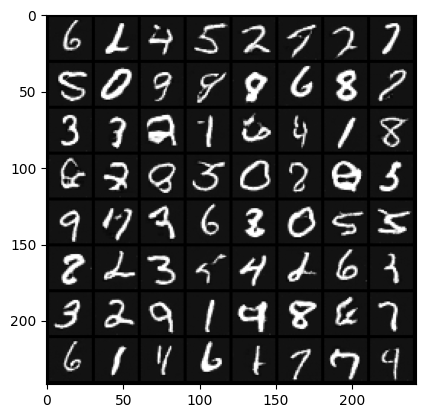

[25/40][150/235]	Loss_D: 0.1033	Loss_G: 0.7121	D(x): 0.7778	D(G(z)): 0.1568 / 0.1624
[25/40][200/235]	Loss_D: 0.1160	Loss_G: 0.8578	D(x): 0.7537	D(G(z)): 0.1552 / 0.0755
[26/40][0/235]	Loss_D: 0.1589	Loss_G: 0.7652	D(x): 0.7914	D(G(z)): 0.2635 / 0.1312
[26/40][50/235]	Loss_D: 0.1020	Loss_G: 0.7910	D(x): 0.8220	D(G(z)): 0.1910 / 0.1146
[26/40][100/235]	Loss_D: 0.1295	Loss_G: 0.7336	D(x): 0.7777	D(G(z)): 0.2092 / 0.1480
[26/40][150/235]	Loss_D: 0.1168	Loss_G: 0.5222	D(x): 0.7484	D(G(z)): 0.1523 / 0.2944
[26/40][200/235]	Loss_D: 0.1122	Loss_G: 0.8082	D(x): 0.7265	D(G(z)): 0.0947 / 0.1040
[27/40][0/235]	Loss_D: 0.1985	Loss_G: 0.5319	D(x): 0.6231	D(G(z)): 0.0970 / 0.2927
[27/40][50/235]	Loss_D: 0.1368	Loss_G: 0.7437	D(x): 0.8165	D(G(z)): 0.2457 / 0.1434
[27/40][100/235]	Loss_D: 0.1045	Loss_G: 0.8579	D(x): 0.8239	D(G(z)): 0.2052 / 0.0758
[27/40][150/235]	Loss_D: 0.2845	Loss_G: 0.8891	D(x): 0.9391	D(G(z)): 0.4849 / 0.0592


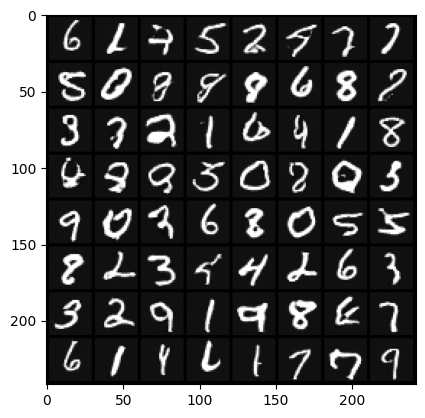

[27/40][200/235]	Loss_D: 0.1072	Loss_G: 0.8725	D(x): 0.8387	D(G(z)): 0.2186 / 0.0678
[28/40][0/235]	Loss_D: 0.1458	Loss_G: 0.8570	D(x): 0.8564	D(G(z)): 0.2782 / 0.0765
[28/40][50/235]	Loss_D: 0.1655	Loss_G: 0.9331	D(x): 0.9530	D(G(z)): 0.3601 / 0.0349
[28/40][100/235]	Loss_D: 0.1330	Loss_G: 0.8486	D(x): 0.7319	D(G(z)): 0.1581 / 0.0809
[28/40][150/235]	Loss_D: 0.0475	Loss_G: 0.7128	D(x): 0.8592	D(G(z)): 0.1109 / 0.1621
[28/40][200/235]	Loss_D: 0.1971	Loss_G: 0.7801	D(x): 0.7020	D(G(z)): 0.2431 / 0.1204
[29/40][0/235]	Loss_D: 0.1050	Loss_G: 0.7990	D(x): 0.8128	D(G(z)): 0.1933 / 0.1093
[29/40][50/235]	Loss_D: 0.1239	Loss_G: 0.6942	D(x): 0.7323	D(G(z)): 0.1447 / 0.1745
[29/40][100/235]	Loss_D: 0.1206	Loss_G: 0.6774	D(x): 0.8767	D(G(z)): 0.2602 / 0.1881
[29/40][150/235]	Loss_D: 0.0696	Loss_G: 0.8497	D(x): 0.9001	D(G(z)): 0.1866 / 0.0803


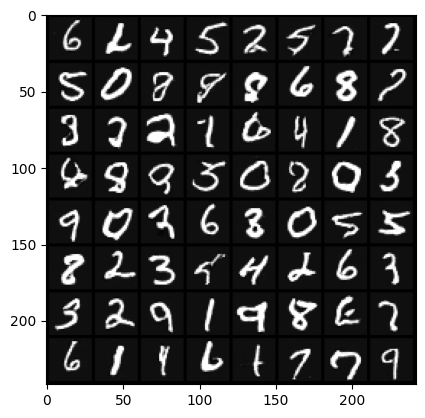

[29/40][200/235]	Loss_D: 0.1170	Loss_G: 0.4580	D(x): 0.7388	D(G(z)): 0.1052 / 0.3531
[30/40][0/235]	Loss_D: 0.0898	Loss_G: 0.8047	D(x): 0.7990	D(G(z)): 0.1387 / 0.1063
[30/40][50/235]	Loss_D: 0.1411	Loss_G: 0.8251	D(x): 0.6916	D(G(z)): 0.1133 / 0.0941
[30/40][100/235]	Loss_D: 0.1530	Loss_G: 0.8362	D(x): 0.6986	D(G(z)): 0.1387 / 0.0881
[30/40][150/235]	Loss_D: 0.1245	Loss_G: 0.7838	D(x): 0.8126	D(G(z)): 0.2231 / 0.1190
[30/40][200/235]	Loss_D: 0.1042	Loss_G: 0.7542	D(x): 0.8133	D(G(z)): 0.1881 / 0.1362
[31/40][0/235]	Loss_D: 0.1607	Loss_G: 0.8250	D(x): 0.9008	D(G(z)): 0.3263 / 0.0953
[31/40][50/235]	Loss_D: 0.1509	Loss_G: 0.8164	D(x): 0.8499	D(G(z)): 0.2933 / 0.0990
[31/40][100/235]	Loss_D: 0.1176	Loss_G: 0.8268	D(x): 0.8079	D(G(z)): 0.2101 / 0.0935
[31/40][150/235]	Loss_D: 0.1044	Loss_G: 0.6161	D(x): 0.7606	D(G(z)): 0.1298 / 0.2257
[31/40][200/235]	Loss_D: 0.1488	Loss_G: 0.4830	D(x): 0.6729	D(G(z)): 0.0920 / 0.3252


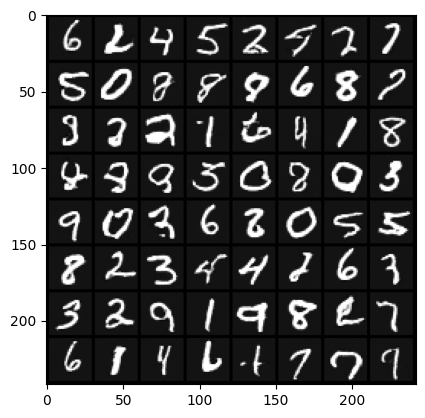

[32/40][0/235]	Loss_D: 0.1372	Loss_G: 0.8041	D(x): 0.7624	D(G(z)): 0.1833 / 0.1068
[32/40][50/235]	Loss_D: 0.1372	Loss_G: 0.7036	D(x): 0.6912	D(G(z)): 0.0781 / 0.1692
[32/40][100/235]	Loss_D: 0.2527	Loss_G: 0.8914	D(x): 0.5597	D(G(z)): 0.0769 / 0.0590
[32/40][150/235]	Loss_D: 0.2249	Loss_G: 0.9176	D(x): 0.9376	D(G(z)): 0.4246 / 0.0428
[32/40][200/235]	Loss_D: 0.3053	Loss_G: 0.7564	D(x): 0.4900	D(G(z)): 0.0468 / 0.1354
[33/40][0/235]	Loss_D: 0.1297	Loss_G: 0.7218	D(x): 0.7711	D(G(z)): 0.1916 / 0.1569
[33/40][50/235]	Loss_D: 0.1759	Loss_G: 0.5821	D(x): 0.6381	D(G(z)): 0.1004 / 0.2517
[33/40][100/235]	Loss_D: 0.1083	Loss_G: 0.7605	D(x): 0.7902	D(G(z)): 0.1786 / 0.1329
[33/40][150/235]	Loss_D: 0.1335	Loss_G: 0.8106	D(x): 0.8909	D(G(z)): 0.2790 / 0.1040
[33/40][200/235]	Loss_D: 0.1245	Loss_G: 0.8178	D(x): 0.8818	D(G(z)): 0.2694 / 0.0982
[34/40][0/235]	Loss_D: 0.1088	Loss_G: 0.8154	D(x): 0.8199	D(G(z)): 0.2064 / 0.1002


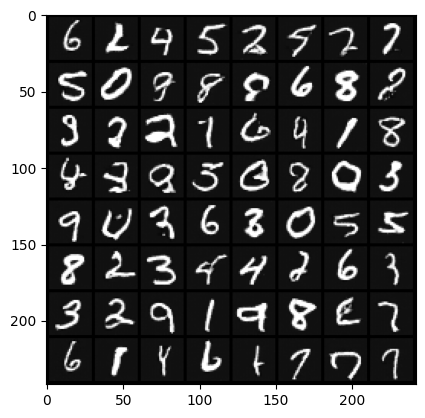

[34/40][50/235]	Loss_D: 0.2029	Loss_G: 0.8669	D(x): 0.6154	D(G(z)): 0.0917 / 0.0707
[34/40][100/235]	Loss_D: 0.2993	Loss_G: 0.8821	D(x): 0.5080	D(G(z)): 0.0871 / 0.0638
[34/40][150/235]	Loss_D: 0.1281	Loss_G: 0.9080	D(x): 0.9107	D(G(z)): 0.2888 / 0.0481
[34/40][200/235]	Loss_D: 0.1236	Loss_G: 0.8520	D(x): 0.8844	D(G(z)): 0.2756 / 0.0791
[35/40][0/235]	Loss_D: 0.1827	Loss_G: 0.8700	D(x): 0.9129	D(G(z)): 0.3579 / 0.0687
[35/40][50/235]	Loss_D: 0.1271	Loss_G: 0.8164	D(x): 0.7178	D(G(z)): 0.1186 / 0.0997
[35/40][100/235]	Loss_D: 0.1439	Loss_G: 0.8148	D(x): 0.7062	D(G(z)): 0.1354 / 0.1025
[35/40][150/235]	Loss_D: 0.0822	Loss_G: 0.6576	D(x): 0.8157	D(G(z)): 0.1419 / 0.1991
[35/40][200/235]	Loss_D: 0.1075	Loss_G: 0.9053	D(x): 0.9268	D(G(z)): 0.2593 / 0.0498
[36/40][0/235]	Loss_D: 0.3866	Loss_G: 0.6767	D(x): 0.4163	D(G(z)): 0.0262 / 0.1958


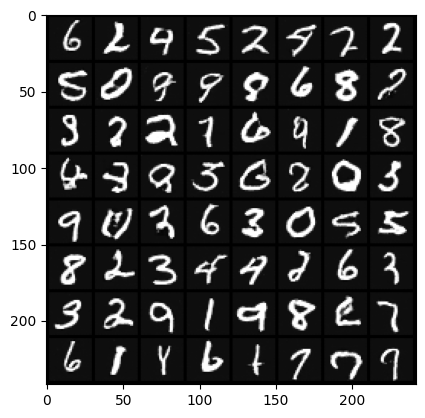

[36/40][50/235]	Loss_D: 0.1953	Loss_G: 0.8184	D(x): 0.5959	D(G(z)): 0.0355 / 0.0981
[36/40][100/235]	Loss_D: 0.1525	Loss_G: 0.8840	D(x): 0.7238	D(G(z)): 0.1726 / 0.0614
[36/40][150/235]	Loss_D: 0.0798	Loss_G: 0.6973	D(x): 0.7936	D(G(z)): 0.1039 / 0.1732
[36/40][200/235]	Loss_D: 0.1050	Loss_G: 0.9208	D(x): 0.8897	D(G(z)): 0.2372 / 0.0412
[37/40][0/235]	Loss_D: 0.1710	Loss_G: 0.8551	D(x): 0.8773	D(G(z)): 0.3242 / 0.0774
[37/40][50/235]	Loss_D: 0.0984	Loss_G: 0.8426	D(x): 0.9041	D(G(z)): 0.2476 / 0.0839
[37/40][100/235]	Loss_D: 0.1266	Loss_G: 0.8582	D(x): 0.8499	D(G(z)): 0.2682 / 0.0751
[37/40][150/235]	Loss_D: 0.0403	Loss_G: 0.8387	D(x): 0.9047	D(G(z)): 0.1328 / 0.0860
[37/40][200/235]	Loss_D: 0.1245	Loss_G: 0.6316	D(x): 0.8992	D(G(z)): 0.2695 / 0.2184
[38/40][0/235]	Loss_D: 0.0479	Loss_G: 0.8680	D(x): 0.8463	D(G(z)): 0.0792 / 0.0702
[38/40][50/235]	Loss_D: 0.1166	Loss_G: 0.8652	D(x): 0.7853	D(G(z)): 0.1762 / 0.0731


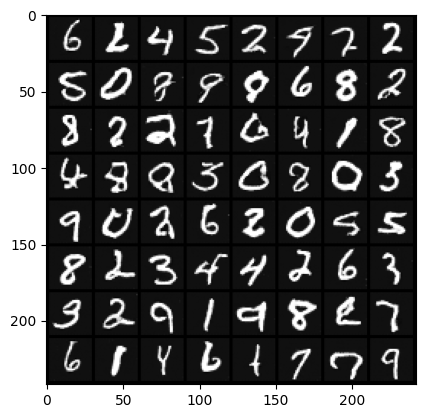

[38/40][100/235]	Loss_D: 0.1571	Loss_G: 0.7786	D(x): 0.8314	D(G(z)): 0.2893 / 0.1225
[38/40][150/235]	Loss_D: 0.1148	Loss_G: 0.7035	D(x): 0.7234	D(G(z)): 0.0833 / 0.1694
[38/40][200/235]	Loss_D: 0.0479	Loss_G: 0.8807	D(x): 0.8392	D(G(z)): 0.0813 / 0.0632
[39/40][0/235]	Loss_D: 0.1239	Loss_G: 0.7980	D(x): 0.8388	D(G(z)): 0.2301 / 0.1107
[39/40][50/235]	Loss_D: 0.0721	Loss_G: 0.5812	D(x): 0.7877	D(G(z)): 0.0687 / 0.2501
[39/40][100/235]	Loss_D: 0.1796	Loss_G: 0.5710	D(x): 0.8701	D(G(z)): 0.3451 / 0.2625
[39/40][150/235]	Loss_D: 0.1308	Loss_G: 0.7400	D(x): 0.8654	D(G(z)): 0.2798 / 0.1456
[39/40][200/235]	Loss_D: 0.2400	Loss_G: 0.7964	D(x): 0.5480	D(G(z)): 0.0413 / 0.1118


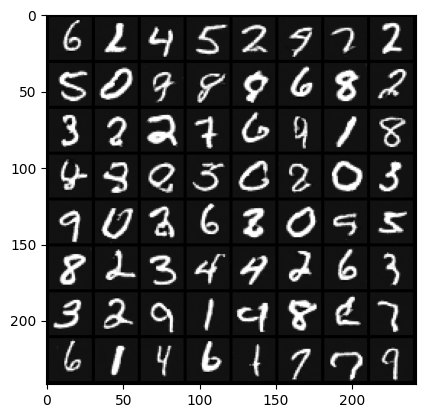

In [30]:
gen_train_ratio = 3
img_list = []
G_losses = []
D_losses = []
iters = 0
print("Starting Training Loop...")
# For each epoch
####
num_epochs = 40
#####
for epoch in range(num_epochs):
    # For each batch in the dataloader
    for i, data in enumerate(data_loader, 0):
        # (1) Update D network: maximize log(D(x)) + log(1 - D(G(z)))
        netD.zero_grad()
        # Format batch
        real_cpu = data[0].to(device)
        # real_cpu = torch.transpose(real_cpu, 1, 3)
        b_size = real_cpu.size(0)
        label = torch.full((b_size,), real_label, dtype=torch.float, device=device)
        # Forward pass real batch through D
        output = netD(real_cpu.type(torch.float))
        # Calculate loss of D on all-real batch
        errD_real = criterion(output, label)
        # Calculate gradients for D in backward pass
        errD_real.backward()
        D_x = output.mean().item()

        ## Train with all-fake batch
        # Generate batch of latent vectors
        noise = torch.randn(b_size, nz, 1, 1, device=device)
        # Generate fake image batch with G
        fake = netG(noise)
        # print(fake.shape)
        label.fill_(fake_label)
        # Classify all fake batch with D
        output = netD(fake.detach())
        # Calculate D's loss on the all-fake batch
        errD_fake = criterion(output, label)
        # Calculate the gradients for this batch, accumulated (summed) with previous gradients
        errD_fake.backward()
        D_G_z1 = output.mean().item()
        # Compute error of D as sum over the fake and the real batches
        errD = errD_real + errD_fake
        # Update D
        optimizerD.step()

        if i % gen_train_ratio == 0:
          # (2) Update G network:
          netG.zero_grad()
          if SATURATION:
            label.fill_(fake_label)  # using it to get -log(1-D(G(z)))
          else:
            label.fill_(real_label) # using it to get -log(D(G(z)))

          # Since we just updated D, perform another forward pass of all-fake batch through D
          output = netD(fake)
          # Calculate G's loss based on this output
          errG = criterion(output, label)
          if SATURATION:
            errG = -errG
          # Calculate gradients for G
          errG.backward()
          D_G_z2 = output.mean().item()
          # Update G
          optimizerG.step()

        # Output training stats
        if i % 50 == 0:
            print('[%d/%d][%d/%d]\tLoss_D: %.4f\tLoss_G: %.4f\tD(x): %.4f\tD(G(z)): %.4f / %.4f'
                    %(epoch, num_epochs, i, len(data_loader),
                     errD.item(), errG.item(), D_x, D_G_z1, D_G_z2))

        # Save Losses for plotting later
        G_losses.append(errG.item())
        D_losses.append(errD.item())

        # Check how the generator is doing by saving G's output on fixed_noise
        iters += 1
        if (iters % 500 == 0) or ((epoch == num_epochs-1) and (i == len(data_loader)-1)):
            with torch.no_grad():
                fake = netG(fixed_noise).detach().cpu()
            im_ = vutils.make_grid(fake, padding=2, normalize=True)
            img_list.append(im_)
            plt.imshow(im_[0], cmap='gray')
            plt.show()

save_path_model = r"/content/drive/MyDrive/CNNS for images course/Ex3/generator models"
torch.save(netG.state_dict(), f"{save_path_model}/Generator_{CRITERION_TYPE}_{gen_train_ratio}.pth")

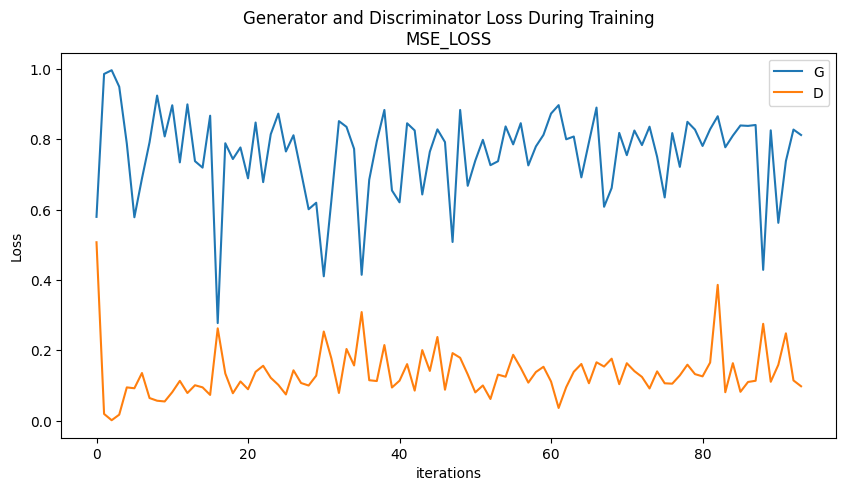

In [31]:
plt.figure(figsize=(10,5))
plt.title(f"Generator and Discriminator Loss During Training\n{CRITERION_TYPE}")
n=100
plt.plot(G_losses[::n],label="G")
plt.plot(D_losses[::n],label="D")
plt.xlabel("iterations")
plt.ylabel("Loss")
plt.legend()
plt.show()

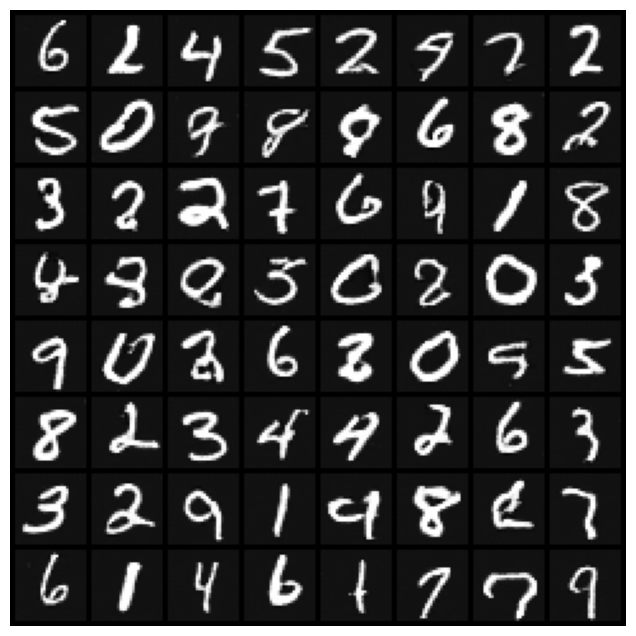

In [32]:
fig = plt.figure(figsize=(8,8))
plt.axis("off")
ims = [[plt.imshow(np.transpose(i,(1,2,0)), animated=True)] for i in img_list]
ani = animation.ArtistAnimation(fig, ims, interval=1000, repeat_delay=1000, blit=True)

HTML(ani.to_jshtml())

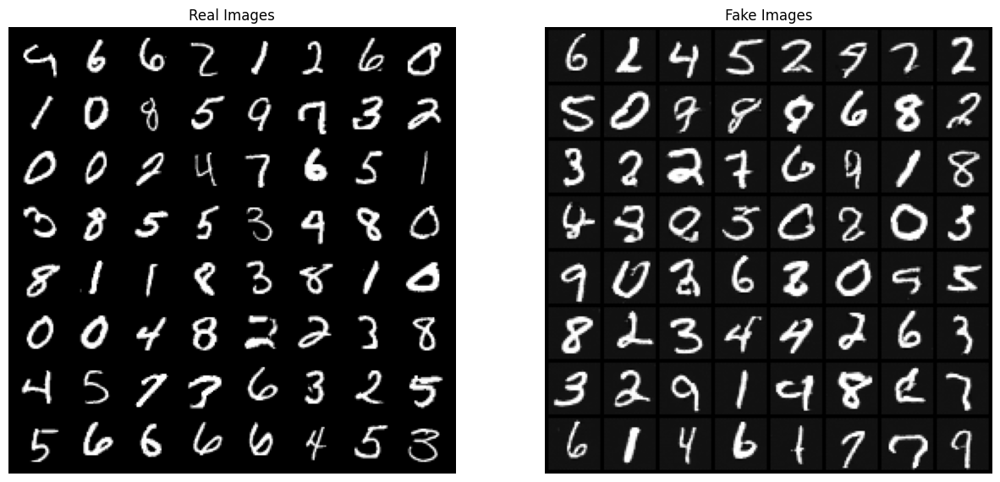

In [33]:
# Grab a batch of real images from the dataloader
real_batch = next(iter(data_loader))

# Plot the real images
plt.figure(figsize=(15,15))
plt.subplot(1,2,1)
plt.axis("off")
plt.title("Real Images")
plt.imshow(np.transpose(vutils.make_grid(real_batch[0].to(device)[:64], padding=5, normalize=True).cpu(),(1,2,0)))

# Plot the fake images from the last epoch
plt.subplot(1,2,2)
plt.axis("off")
plt.title("Fake Images")
plt.imshow(np.transpose(img_list[-1],(1,2,0)))
plt.show()

Question 2
-------
Model Inversion. One elementary operation that can be performed as a basis for various applications (such as image editing) is GAN inversion; namely, given an image I, find its source latent vector z that reproduces that image, i.e., maps G(z) = I where G is the generator. This should be implemented on a trained G, and optimized over the latent space of z vectors. Explain which features in the image are accurately reconstructed, and which aren’t. Please provide an explanation of why you think this is the case.

In [44]:
N = 24
I = next(iter(data_loader))[0][:N, ...]

In [57]:
# encoder = Encoder(d=nz).to(device)
# criterion = nn.MSELoss()
# optimizer = torch.optim.Adam(encoder.parameters(), lr=0.001)

genTrained = Generator().to(device)
# path = r"/content/drive/MyDrive/CNNS for images course/Ex3/generator models/Generator_NON_SATURATING_VERSION_3.pth"
path = r"/content/drive/MyDrive/CNNS for images course/Ex3/generator models/Generator_MSE_LOSS_3.pth"
genTrained.load_state_dict(torch.load(path))
genTrained.eval()

Generator(
  (gen_CNN): Sequential(
    (0): ConvTranspose2d(100, 512, kernel_size=(4, 4), stride=(1, 1))
    (1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): ConvTranspose2d(512, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
    (4): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): ReLU(inplace=True)
    (6): ConvTranspose2d(256, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
    (7): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (8): ReLU(inplace=True)
    (9): ConvTranspose2d(128, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
    (10): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (11): ReLU(inplace=True)
    (12): ConvTranspose2d(64, 1, kernel_size=(1, 1), stride=(1, 1), padding=(2, 2))
    (13): Tanh()
  )
)

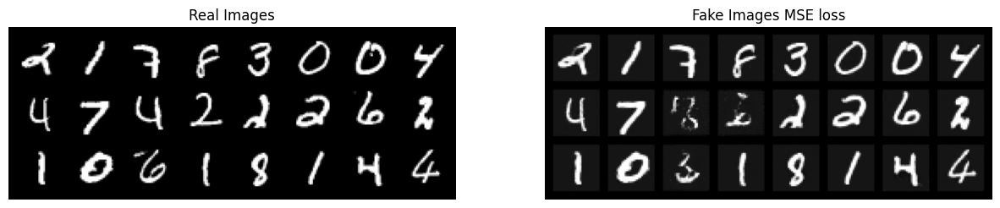

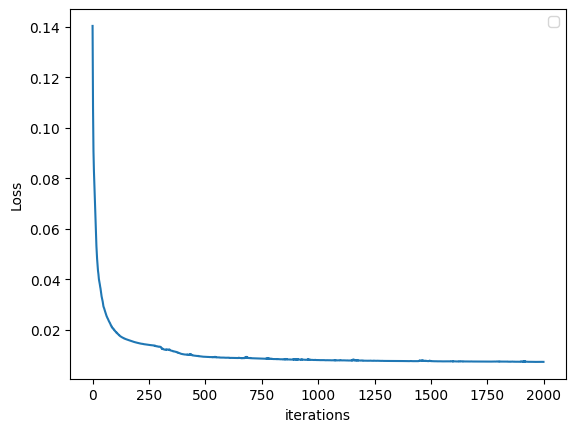

In [58]:
def invert_GAN(G, I, latent_dim, N, lr=0.1, steps=1000):
    """
    G: trained generator
    I: target image
    latent_dim: dimension of the latent space
    lr: learning rate for the optimizer
    steps: number of optimization steps
    N: number of images
    """
    I = I.to(device)
    # Initialize the latent vector z with random values
    z = torch.randn(N, latent_dim,1, 1, requires_grad=True, device=device)
    
    # Define the optimizer
    optimizer = torch.optim.Adam([z], lr=lr)
    loss_list = []
    # Optimize z to minimize the difference between G(z) and I
    for step in range(steps):
        optimizer.zero_grad()
        loss = torch.nn.functional.mse_loss(G(z), I)
        loss.backward()
        optimizer.step()
        loss_list.append(loss.item())
    
    return z.detach(), G(z).detach().cpu(), loss_list


G = genTrained
latent_dim = nz

# print(I.shape)
z, I_Gen, loss_list = invert_GAN(G, I, latent_dim, N, lr=0.1, steps=2000)

# Plot the real images
plt.figure(figsize=(15,15))
plt.subplot(1,2,1)
plt.axis("off")
plt.title("Real Images")
plt.imshow(np.transpose(vutils.make_grid(I, padding=5, normalize=True).cpu(),(1,2,0)))

# Plot the fake images from the last epoch
plt.subplot(1,2,2)
plt.axis("off")
plt.title("Fake Images MSE loss")
# plt.title("Fake Images non saturating BCE loss")
plt.imshow(np.transpose(vutils.make_grid(I_Gen, padding=5, normalize=True).cpu(),(1,2,0)))
plt.show()

plt.plot(loss_list)
plt.xlabel("iterations")
plt.ylabel("Loss")
plt.legend()
plt.show()

Question 3
-------
Image restoration. The generative abilities of a GAN, coupled with the ability to encode images in the GAN latent space allows restoring corrupted images. This can be done by searching for the closest latent vector in the GAN's latent space for the corrupted image, and using it to reproduce the restored image. Formally, we’s like to solve min_z  ||G(z) - I || where I is the corrupted image. This search should be invariant, as much as possible, to the corruption itself and hence the norm || . || should be carefully considered with respect to the corruption at hand. Consider this approach for two tasks:


a. restoration of noisy images (denoising), use i.i.d. Normal noise with m=0,   
and std around 0.1 (for pixels values within [0,1])


b. Filling missing pixels in images with holes (inpainting), where you delete random windows of around 8x8 pixels.


In [90]:
N = 4
I = next(iter(data_loader))[0][:N, ...]

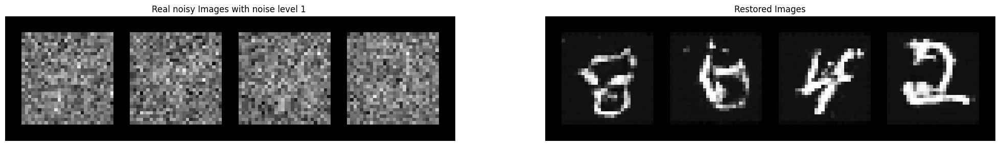

In [115]:
# Corrupt the images by adding Gaussian noise
def invert_corrupt_GAN(G, I, latent_dim, N, mask, lr=0.1, steps=3000):
    """
    G: trained generator
    I: target image
    latent_dim: dimension of the latent space
    lr: learning rate for the optimizer
    steps: number of optimization steps
    N: number of images
    """
    I = I.to(device)
    mask = mask.to(device)
    # Initialize the latent vector z with random values
    z = torch.randn(N, latent_dim,1, 1, requires_grad=True, device=device)
    
    # Define the optimizer
    optimizer = torch.optim.Adam([z], lr=lr)
    loss_list = []
    # Optimize z to minimize the difference between G(z) and I
    for step in range(steps):
        optimizer.zero_grad()
        img_gen = G(z)
        loss = torch.nn.functional.mse_loss(img_gen, I)
        loss.backward()
        optimizer.step()
        loss_list.append(loss.item())
    
    return z.detach(), G(z).detach().cpu(), loss_list


G = genTrained
latent_dim = nz


noise = torch.randn_like(I)
noise_ratio = 1
mask = noise_ratio * noise
corrupted_images_noise = I + mask



# restored 
z, I_restored, loss_list = invert_corrupt_GAN(G, corrupted_images_noise, latent_dim, N, mask,)

plt.figure(figsize=(25,25))
plt.subplot(1,2,1)
plt.axis("off")
plt.title(f"Real noisy Images with noise level {noise_ratio} ")
plt.imshow(np.transpose(vutils.make_grid(corrupted_images_noise, padding=5, normalize=True).cpu(),(1,2,0)))

# Plot the fake images from the last epoch
plt.subplot(1,2,2)
plt.axis("off")
plt.title("Restored Images")
plt.imshow(np.transpose(vutils.make_grid(I_restored, padding=5, normalize=True).cpu(),(1,2,0)))
plt.show()


Text(0.5, 1.0, 'restored')

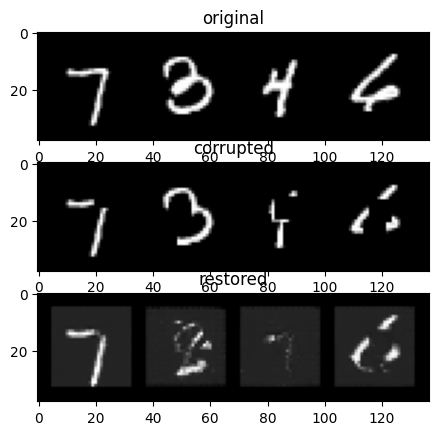

In [138]:
# Corrupt the images by deleting random windows of pixels
N = 4
I = next(iter(data_loader))[0][:N, ...]
orig = I.clone()
mask = torch.ones(I.shape)
corrupted_images_holes = I
window_size = 8
num_holes = 3
for i in range(I.shape[0]):
    for j in range(num_holes):
      x = torch.randint(0, I.shape[2] - window_size + 1, (1,))
      y = torch.randint(0, I.shape[3] - window_size + 1, (1,))
      corrupted_images_holes[i, :, x:x+window_size, y:y+window_size] = 0
      mask[i, :, x:x+window_size, y:y+window_size] = 0

z, I_restored, loss_list = invert_corrupt_GAN(G, corrupted_images_holes, latent_dim, N, mask, lr=0.1)

fig, (ax1, ax2, ax3) = plt.subplots(3)

ax1.imshow(np.transpose(vutils.make_grid(orig, padding=5, normalize=True).cpu(),(1,2,0)))
ax1.set_title('original')

ax2.imshow(np.transpose(vutils.make_grid(corrupted_images_holes, padding=5, normalize=True).cpu(),(1,2,0)))
ax2.set_title('corrupted')

ax3.imshow(np.transpose(vutils.make_grid(I_restored, padding=5, normalize=True).cpu(),(1,2,0)))
ax3.set_title('restored')


# plt.figure(figsize=(25,25))
# plt.subplot(1,2,1)
# plt.axis("off")
# plt.title("Real holly Images")
# plt.imshow(np.transpose(vutils.make_grid(corrupted_images_holes, padding=5, normalize=True).cpu(),(1,2,0)))

# # Plot the fake images from the last epoch
# plt.subplot(1,2,2)
# plt.axis("off")
# plt.title("Restored Images")
# plt.imshow(np.transpose(vutils.make_grid(I_restored, padding=5, normalize=True).cpu(),(1,2,0)))
# plt.show()